### Model Training with Image size of 320 and batch size of 32

In [5]:
# Install Ultralytics library
!pip install ultralytics

In [4]:
import torch

print("Is CUDA available:", torch.cuda.is_available())
print("GPU device name:", torch.cuda.get_device_name(1) if torch.cuda.is_available() else "No GPU")


Is CUDA available: True
GPU device name: NVIDIA L40S


In [2]:
!python train.py --img 320 --batch 32 --epochs 100 --data data.yaml --weights yolov5n.pt --cache --device 1

2024-12-15 18:51:55.637367: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734310315.653812  549082 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734310315.658663  549082 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5n.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=320, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=1, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist

In [22]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO

In [29]:
# Define the path to the directory
train_path = 'runs/train/exp11'

# List the files in the directory
!ls {train_path}

confusion_matrix.png				    results.csv
events.out.tfevents.1734310317.aq-field51.549082.0  results.png
F1_curve.png					    train_batch0.jpg
hyp.yaml					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
opt.yaml					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    weights


#### The confusion matrix for our YOLOv5 nano vehicle detection model indicates high accuracy. In 98% of cases, the model successfully identifies the vehicle when there is one, indicating strong detection capability. Conversely, in just 2% of cases, the model fails to detect a vehicle that is present, indicating some room of improvement

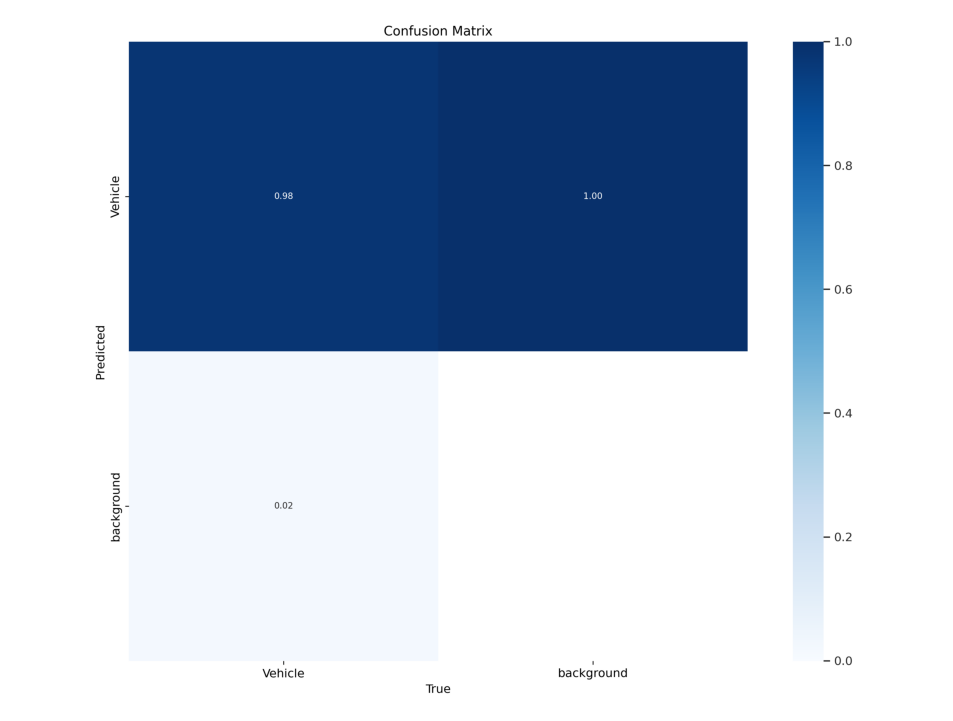

In [17]:
# Construct the path to the normalized confusion matrix image
cnf_path = os.path.join(train_path, 'confusion_matrix.png')

# Read the image using cv2
cm_img = cv2.imread(cnf_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

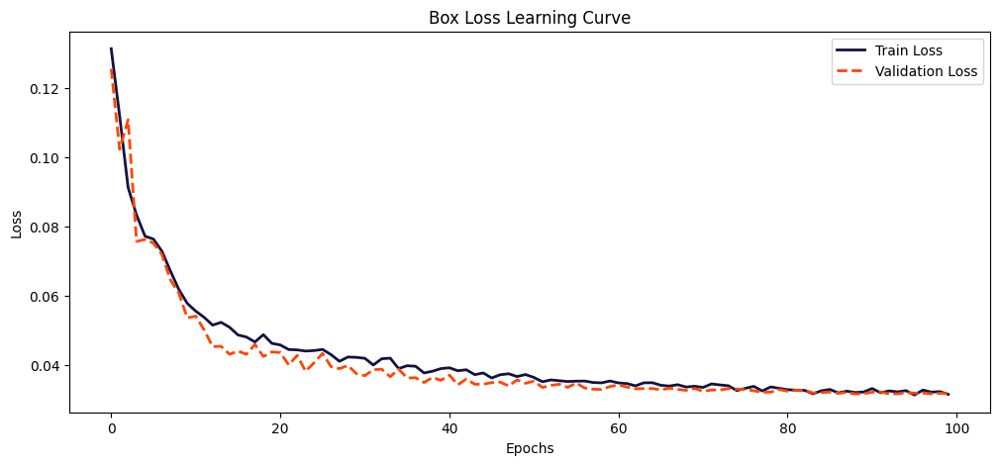

In [13]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(train_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')

#### <p>Our model shows impressive results on the validation set with precision of around 91% and recall of around 93% indicating that the model is able to find most of relevant cases in the our dataset. The models mean average Precision (mAP) at 50% IOU is around 95% indicating high accuracy in finding objects with good overlap with actual true bounding box.</p>

In [44]:
!python val.py --weights runs/train/exp11/weights/best.pt --img 320 --conf 0.5 --data data.yaml

val: data=data.yaml, weights=['runs/train/exp11/weights/best.pt'], batch_size=32, imgsz=320, conf_thres=0.5, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.5 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-387-g4c904ac7 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA L40S, 45596MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
val: Scanning /mnt/raid_nvmeblue/r134p694/Vehicle_Detection_Image_Dataset/valid/
                 Class     Images  Instances          P          R      mAP50   
                   all         90        937      0.907       0.93      0.947       0.69
Speed: 0.1ms pre-process, 13.9ms inference, 2.7ms NMS per image at shape (32, 3, 320, 320)
Results saved to runs/val/exp9


### Pruning the model via structured pruning

In [47]:
from models.common import DetectMultiBackend
import torch

# Load the checkpoint first
checkpoint = torch.load("runs/train/exp11/weights/best.pt", map_location="cuda:0") 

# Check the keys in the checkpoint to confirm available information
print(checkpoint.keys())


dict_keys(['epoch', 'best_fitness', 'model', 'ema', 'updates', 'optimizer', 'opt', 'git', 'date'])


In [50]:
import torch.nn.utils.prune as prune
import torch.nn as nn

def model_struc_prune(model, amount=0.2):
    for name, module in model.model.named_modules():
        if isinstance(module, nn.Conv2d):  
            prune.ln_structured(module, name="weight", amount=amount, n=2, dim=0)
            prune.remove(module, "weight")

model = checkpoint['model'] 
model_struc_prune(model, amount=0.2)


torch.save({
    "model": checkpoint["model"],  
    "state_dict": model.state_dict(),  
    "epoch": checkpoint["epoch"],  
    "optimizer": checkpoint.get("optimizer", None), 
    "opt": checkpoint["opt"], 
}, "runs/train/exp11/pruned_model.pt")

### Fine-Tuning the model to restore the performance by training it for 10 epochs

#### <p> Precision has been restored to about 90% and recall to about 91% </p>

In [52]:
!python train.py --img 320 --batch 32 --epochs 10 --data data.yaml --weights runs/train/exp11/pruned_model.pt --device 1

2024-12-15 22:11:26.666811: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734322286.682588  631503 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734322286.687334  631503 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=runs/train/exp11/pruned_model.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=32, imgsz=320, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=1, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/

### Exporting the model as Tensorflowlite Float16 model

In [53]:
!python export.py --weights runs/train/exp12/weights/best.pt --data data.yaml --img 320 --include tflite

export: data=data.yaml, weights=['runs/train/exp12/weights/best.pt'], imgsz=[320], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=False, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v7.0-387-g4c904ac7 Python-3.12.7 torch-2.5.1+cu124 CPU

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs

PyTorch: starting from runs/train/exp12/weights/best.pt with output shape (1, 6300, 6) (3.6 MB)
2024-12-15 22:19:34.838963: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734322774.854824  633672 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuD

In [46]:
!python val.py --weights runs/train/exp14/weights/best-fp16.tflite --img 320 --conf 0.5 --data data.yaml

val: data=data.yaml, weights=['runs/train/exp14/weights/best-fp16.tflite'], batch_size=32, imgsz=320, conf_thres=0.5, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.5 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-387-g4c904ac7 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA L40S, 45596MiB)

2024-12-20 19:21:56.067640: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734744116.083145 1993427 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734744116.087737 1993427 cuda_blas.cc:1418] Unable to register cuBLAS factory: Att

### Sample predictions via tflite float16 model

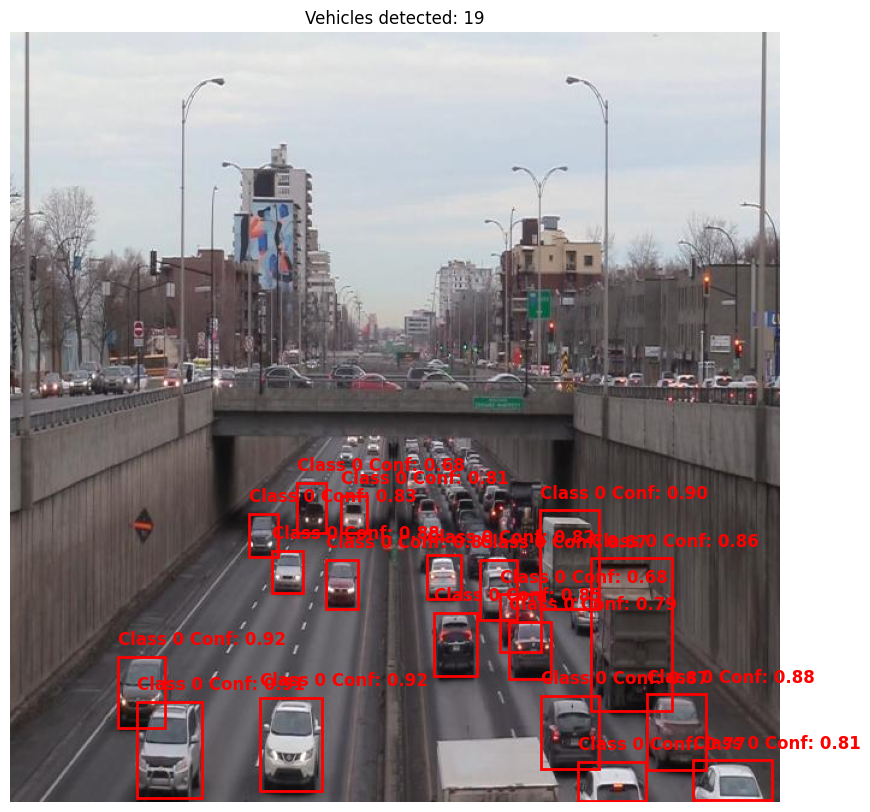

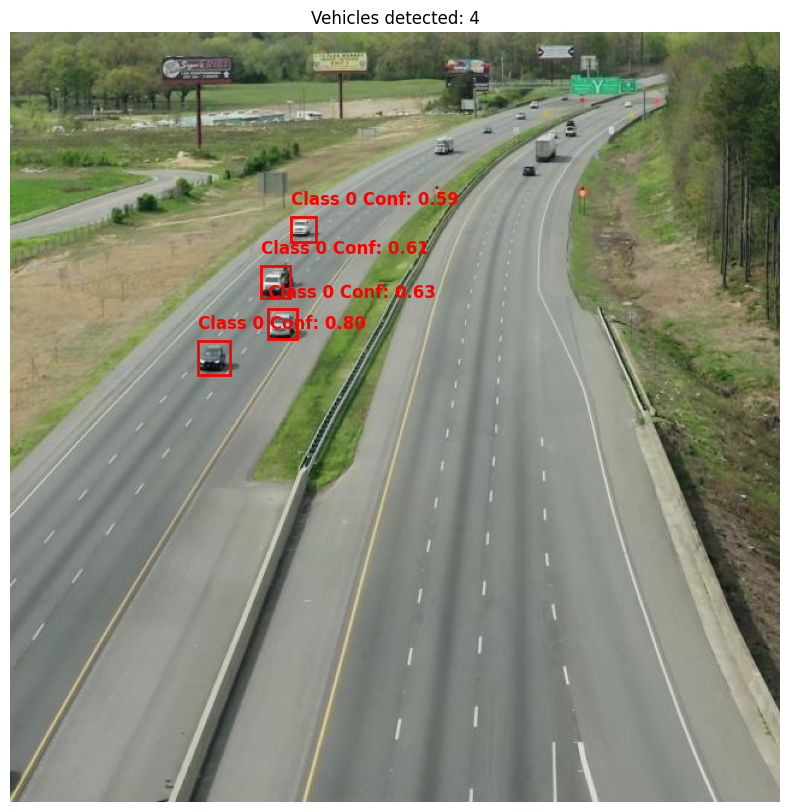

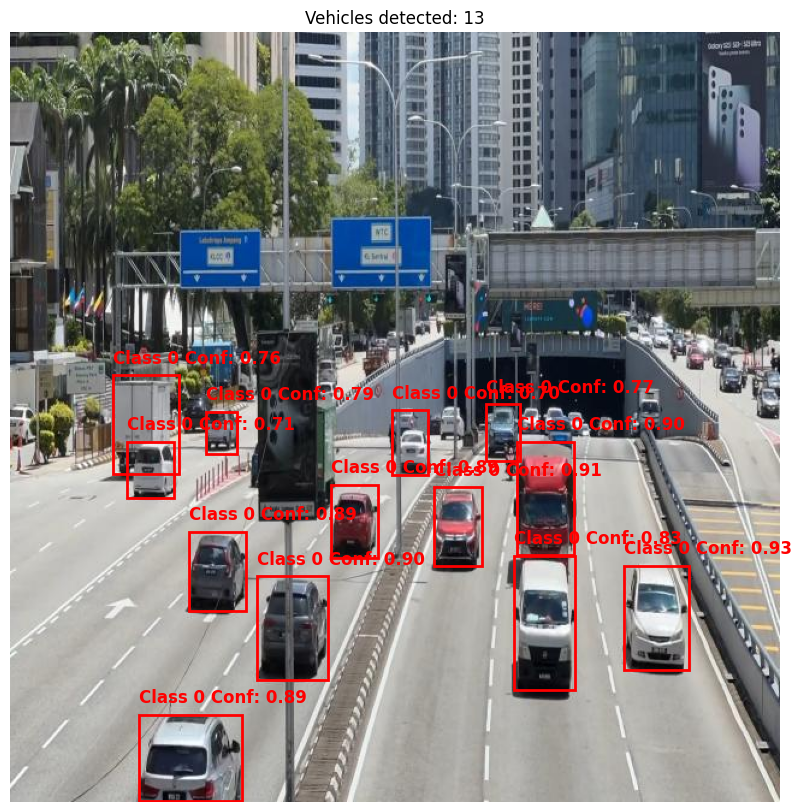

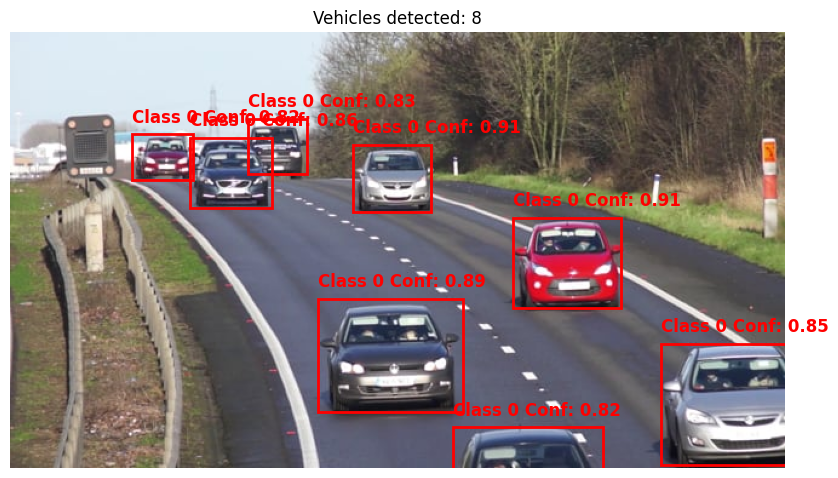

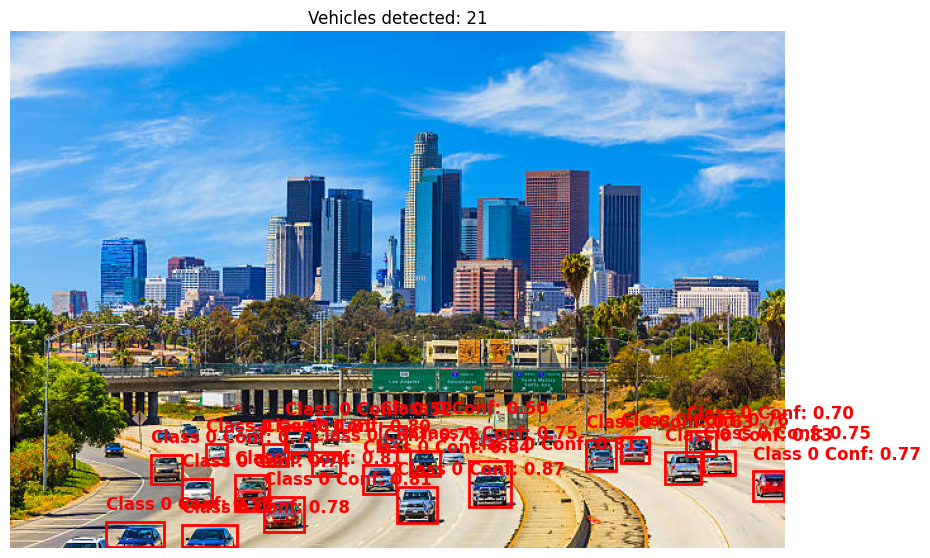

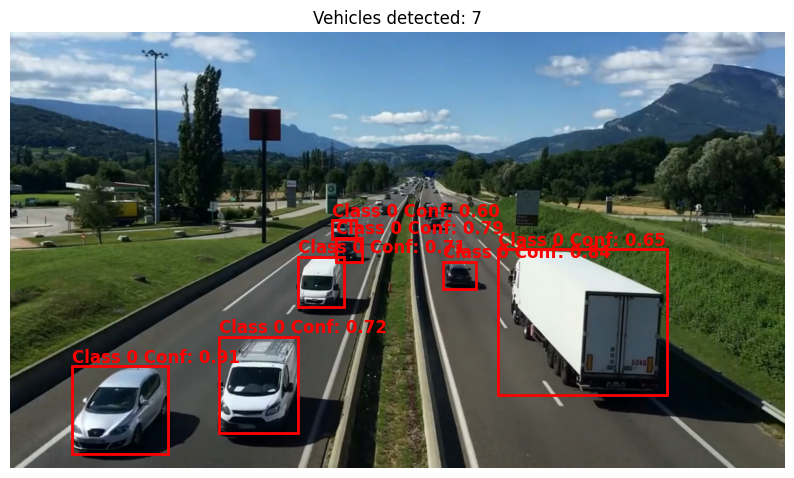

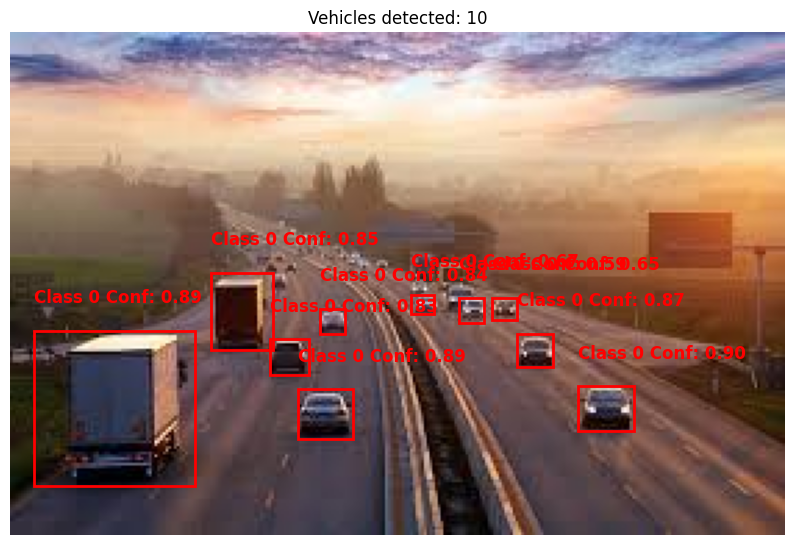

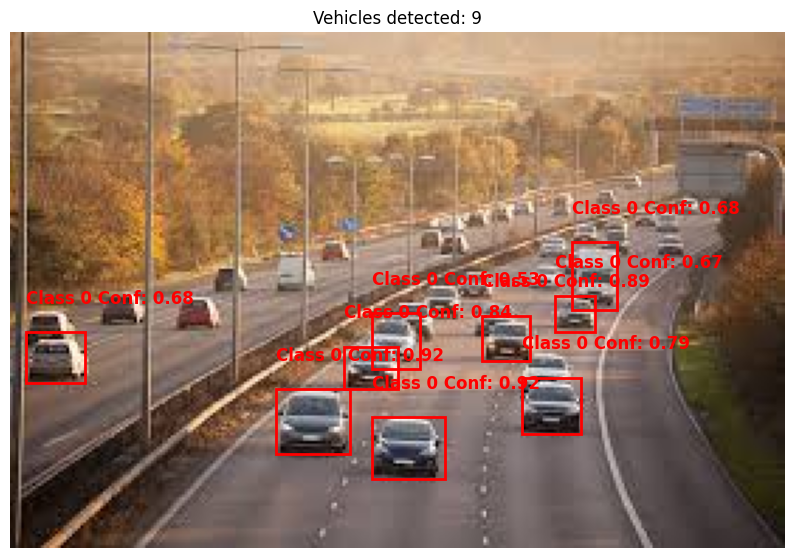

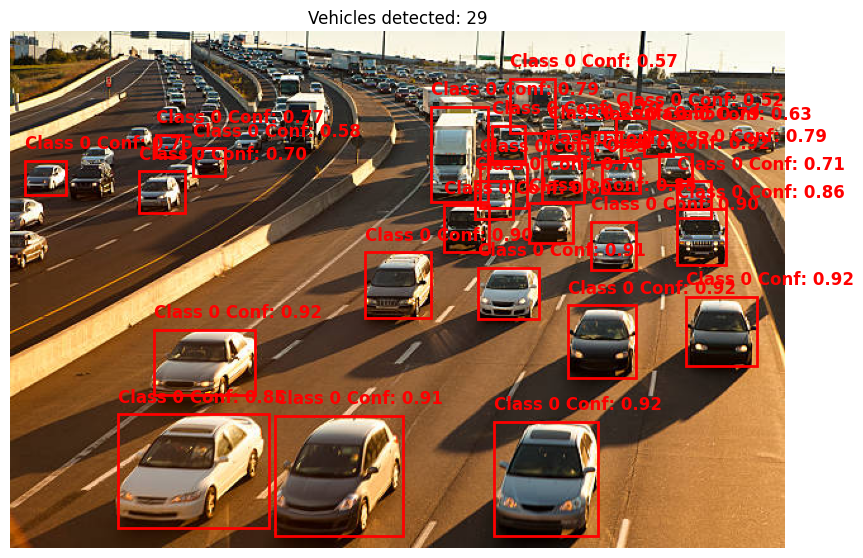

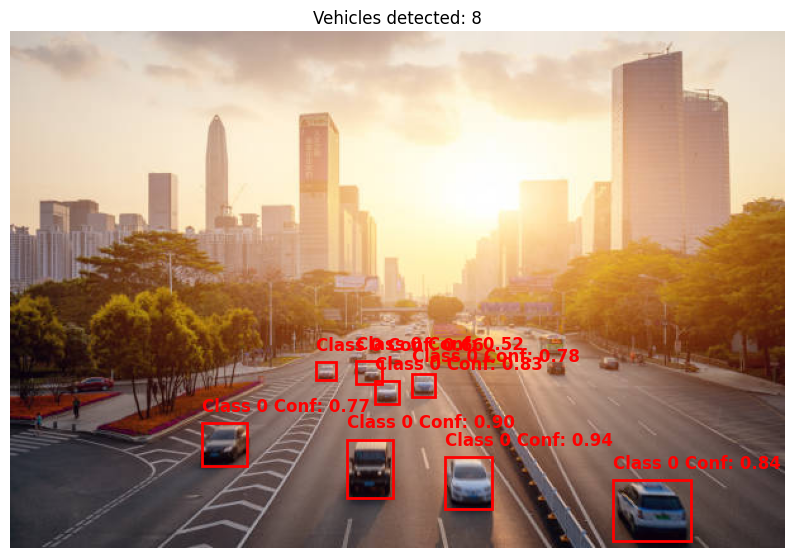

In [16]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def load_model(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    return interpreter

def preprocess_image(image_path, input_shape):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = cv2.resize(image_rgb, (input_shape[2], input_shape[1]))
    normalized_image = resized_image / 255.0
    return np.expand_dims(normalized_image, axis=0).astype(np.float32), image_rgb

def quantize_input(input_data, scale, zero_point):
    return (input_data / scale + zero_point).astype(np.uint8)

def dequantize_output(output_data, scale, zero_point):
    return (output_data - zero_point) * scale

def filter_detections(detections, confidence_threshold, img_shape):
    boxes, scores, classes = [], [], []
    for detection in detections:
        cx, cy, w, h, score, cls = detection
        if score > confidence_threshold:
            x_min = max(0, int((cx - w / 2) * img_shape[1]))
            x_max = min(img_shape[1], int((cx + w / 2) * img_shape[1]))
            y_min = max(0, int((cy - h / 2) * img_shape[0]))
            y_max = min(img_shape[0], int((cy + h / 2) * img_shape[0]))

            if x_max > x_min and y_max > y_min:
                boxes.append([y_min, x_min, y_max, x_max])
                scores.append(score)
                classes.append(int(cls))
    return boxes, scores, classes

def apply_nms(boxes, scores, max_output, iou_threshold, score_threshold):
    indices = tf.image.non_max_suppression(
        boxes=np.array(boxes),
        scores=np.array(scores),
        max_output_size=max_output,
        iou_threshold=iou_threshold,
        score_threshold=score_threshold
    ).numpy()
    return indices

def visualize_detections(image, boxes, scores, classes, title):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)

    for idx, (y_min, x_min, y_max, x_max) in enumerate(boxes):
        label = f"Class {classes[idx]} Conf: {scores[idx]:.2f}"
        rect = mpatches.Rectangle(
            (x_min, y_min), x_max - x_min, y_max - y_min,
            linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(x_min, y_min - 10, label, color='red', fontsize=12, fontweight='bold')

    ax.axis('off')
    plt.title(title)
    plt.show()

def process_images(image_dir, model_file, confidence_threshold=0.5, nms_iou=0.45):
    interpreter = load_model(model_file)
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    input_shape = input_details[0]['shape']
    input_scale, input_zero_point = input_details[0]['quantization']
    output_scale, output_zero_point = output_details[0]['quantization']

    images = [f for f in os.listdir(image_dir) if f.lower().endswith(('jpg', 'jpeg'))]

    for img_name in images:
        img_path = os.path.join(image_dir, img_name)
        input_data, original_image = preprocess_image(img_path, input_shape)

        if input_details[0]['dtype'] == np.uint8:
            input_data = quantize_input(input_data, input_scale, input_zero_point)

        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        detections = interpreter.get_tensor(output_details[0]['index'])[0]
        if output_details[0]['dtype'] == np.uint8:
            detections = dequantize_output(detections, output_scale, output_zero_point)

        boxes, scores, classes = filter_detections(detections, confidence_threshold, original_image.shape)

        if not boxes:
            plt.imshow(original_image)
            plt.title("No vehicles detected")
            plt.axis('off')
            plt.show()
            continue

        nms_indices = apply_nms(boxes, scores, max_output=100, iou_threshold=nms_iou, score_threshold=confidence_threshold)
        final_boxes = np.array(boxes)[nms_indices]
        final_scores = np.array(scores)[nms_indices]
        final_classes = np.array(classes)[nms_indices]

        visualize_detections(original_image, final_boxes, final_scores, final_classes, f"Vehicles detected: {len(final_boxes)}")

# Main execution
model_path = "runs/train/exp12/weights/best-fp16.tflite"
image_directory = "/mnt/raid_nvmeblue/r134p694/Vehicle_Detection_Image_Dataset/temp_dem"
process_images(image_directory, model_path)

### Float16 to int8 conversion

In [15]:
import tensorflow as tf
import os
import numpy as np
import cv2

# Directory paths
IMAGE_FOLDER = "/mnt/raid_nvmeblue/r134p694/Vehicle_Detection_Image_Dataset/valid/images/"
OUTPUT_TFLITE_MODEL = "runs/train/exp12/best-int8_quantized.tflite"
MODEL_DIR = "runs/train/exp12/weights/best_saved_model"

# Function to preprocess and yield images for the representative dataset
def representative_data_generator(input_folder, image_size=(320, 320)):
    image_files = [os.path.join(input_folder, f) for f in os.listdir(input_folder)
                   if f.endswith(('.jpg', '.jpeg', '.png'))]

    for img_file in image_files:
        image = cv2.imread(img_file)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
        resized_image = cv2.resize(image_rgb, image_size)
        normalized_image = resized_image.astype(np.float32) / 255.0  # Normalize pixel values
        expanded_image = np.expand_dims(normalized_image, axis=0)  # Add batch dimension
        yield [expanded_image]

# Load the trained model for conversion
converter = tf.lite.TFLiteConverter.from_saved_model(MODEL_DIR)

# Configure INT8 quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = lambda: representative_data_generator(IMAGE_FOLDER)

# Restrict operations to INT8 for input/output
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.uint8

# Convert the model to TFLite INT8 format
int8_quantized_model = converter.convert()

# Save the converted model to file
with open(OUTPUT_TFLITE_MODEL, "wb") as output_file:
    output_file.write(int8_quantized_model)

print(f"Quantized INT8 model successfully saved to: {OUTPUT_TFLITE_MODEL}")


W0000 00:00:1734456948.453430  643719 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1734456948.453454  643719 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
2024-12-17 11:35:48.453647: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: runs/train/exp12/weights/best_saved_model
2024-12-17 11:35:48.456925: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2024-12-17 11:35:48.456940: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: runs/train/exp12/weights/best_saved_model
2024-12-17 11:35:48.480217: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2024-12-17 11:35:48.520449: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: runs/train/exp12/weights/best_saved_model
2024-12-17 11:35:48.560213: I tensorflow/cc/saved_model/loader.cc:466] SavedModel load for tags { serve }; Status: success:

Quantized INT8 model successfully saved to: runs/train/exp12/best-int8_quantized.tflite


fully_quantize: 0, inference_type: 6, input_inference_type: UINT8, output_inference_type: UINT8
2024-12-17 11:36:05.585514: I tensorflow/compiler/mlir/lite/flatbuffer_export.cc:3893] Estimated count of arithmetic ops: 1.231 G  ops, equivalently 0.616 G  MACs


### Inferences observed with int8 model

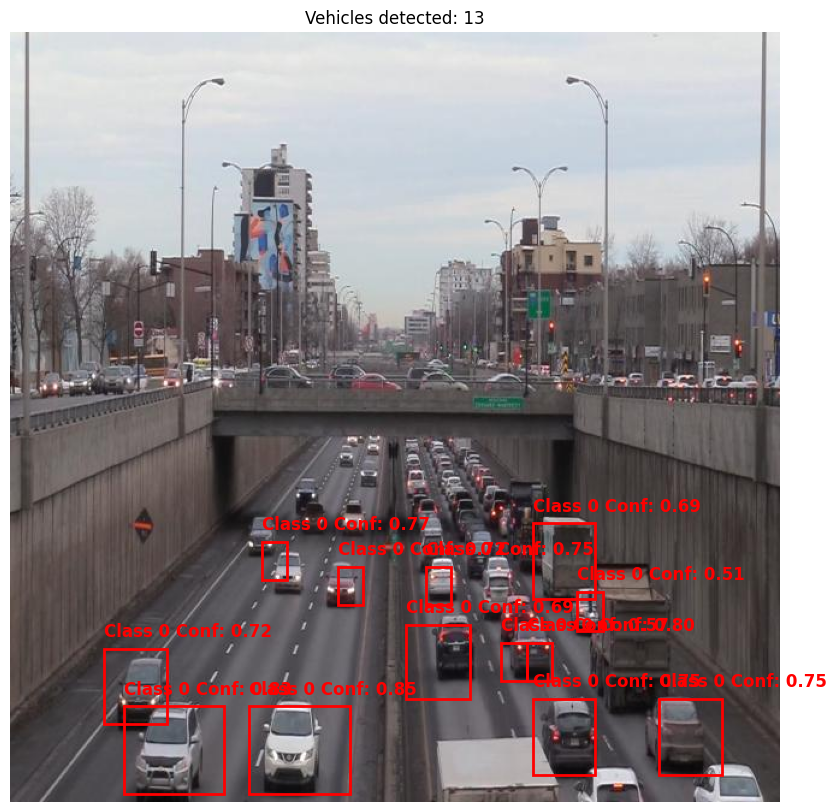

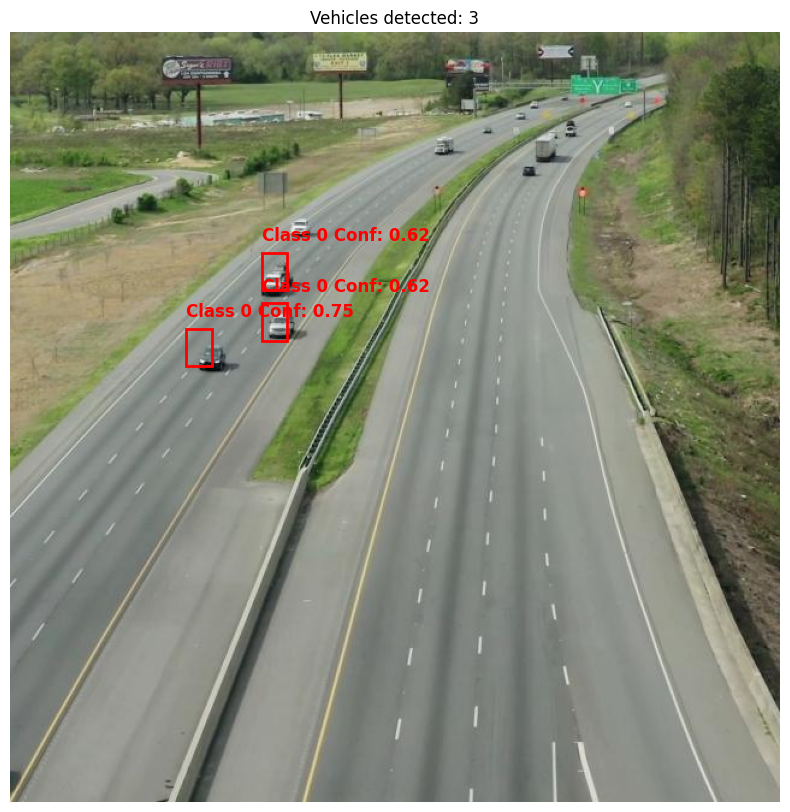

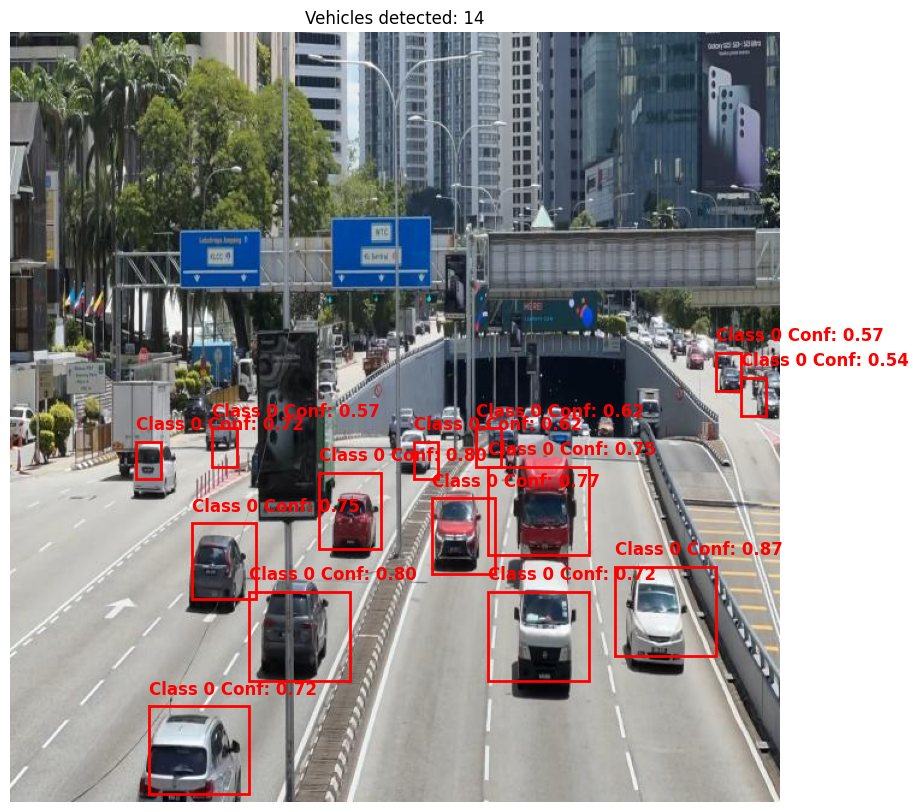

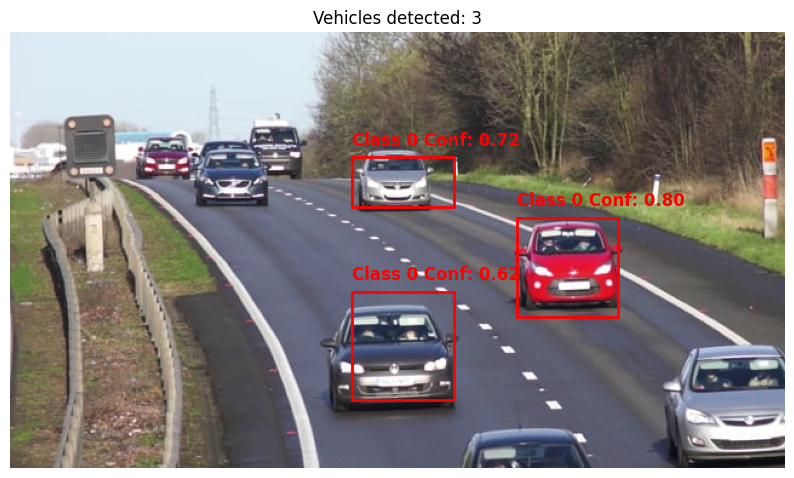

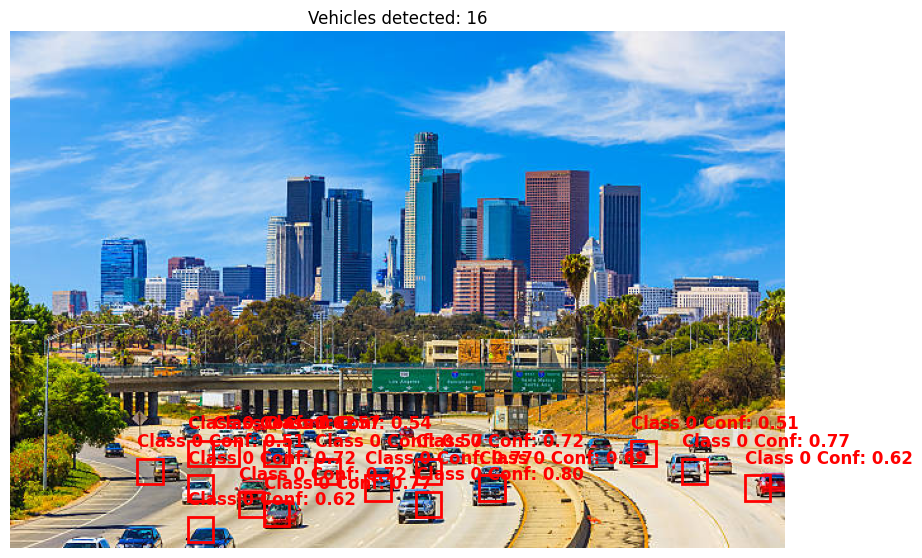

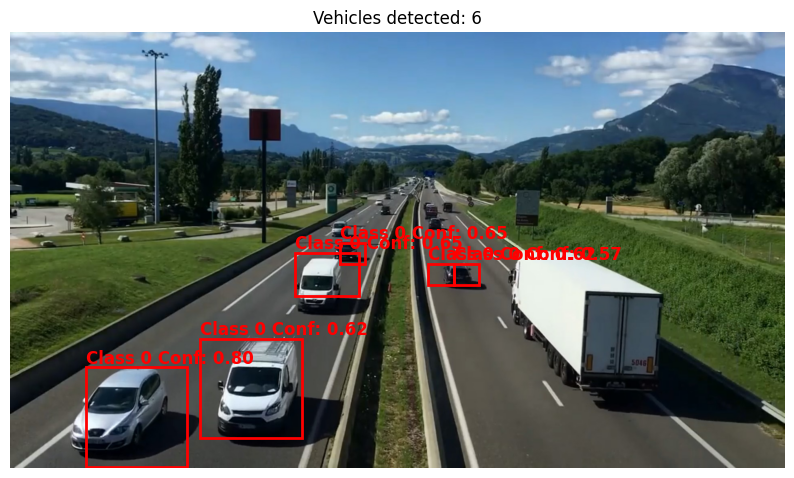

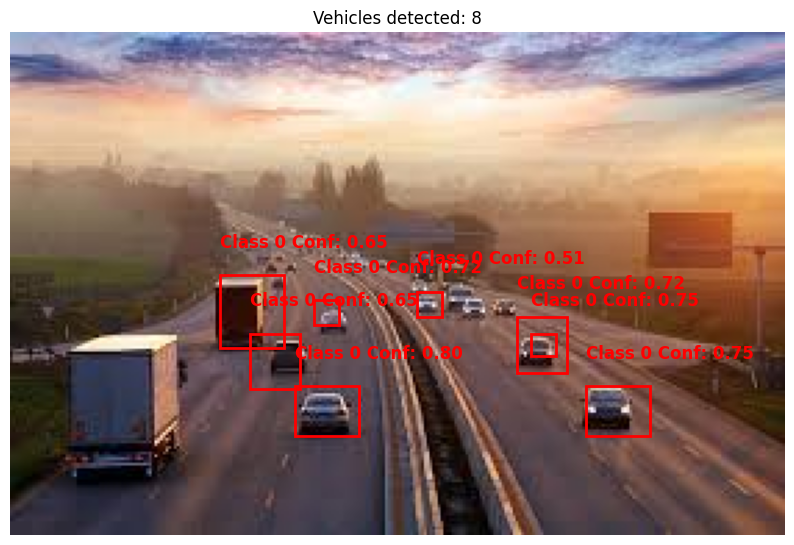

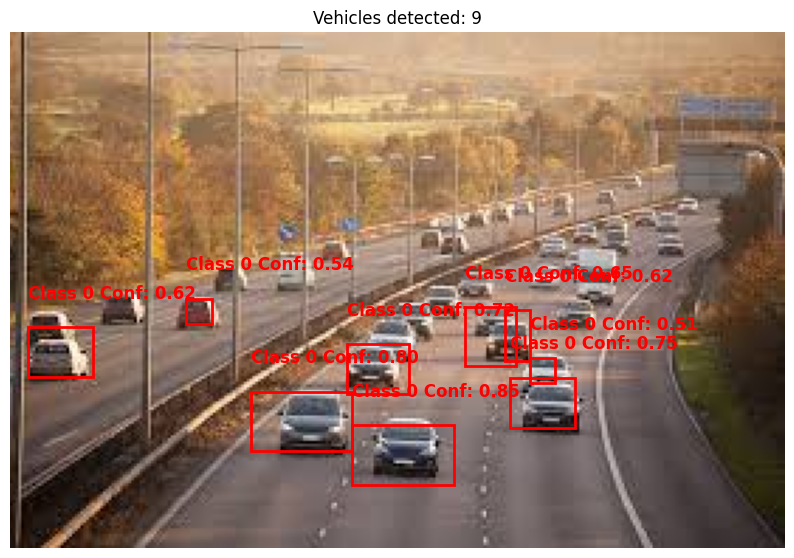

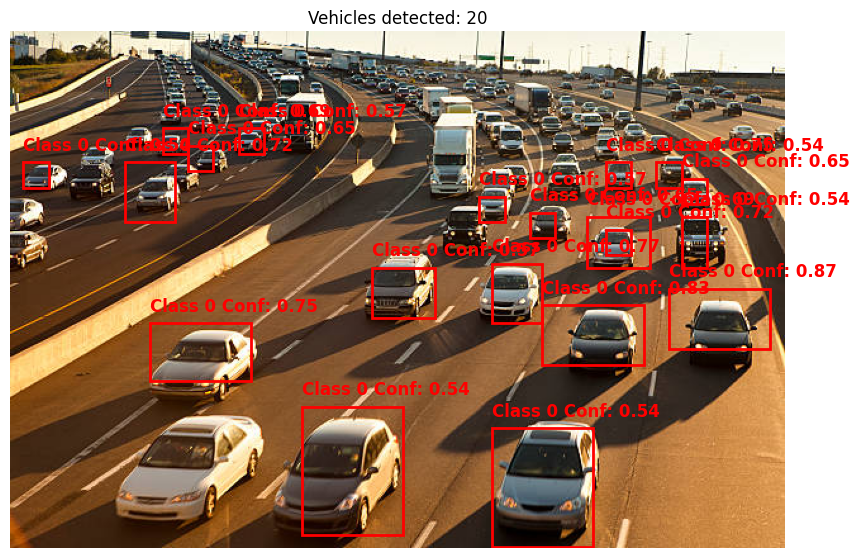

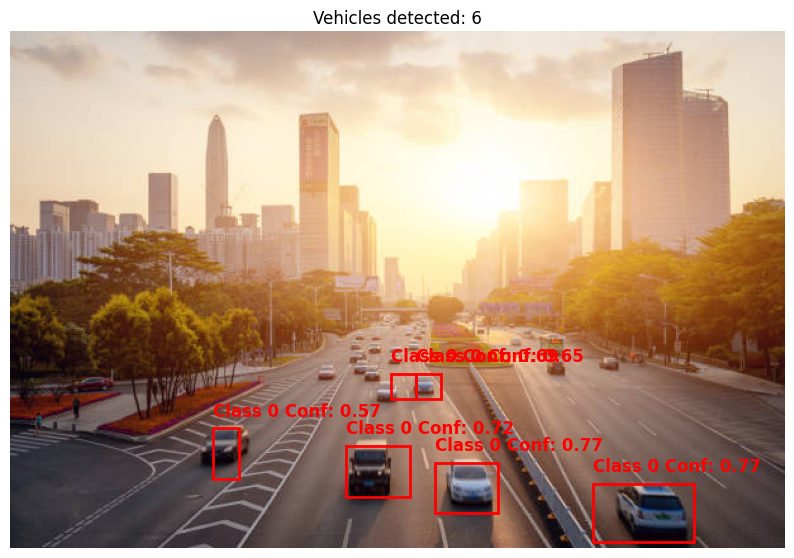

In [17]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def load_model(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    return interpreter

def preprocess_image(image_path, input_shape):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = cv2.resize(image_rgb, (input_shape[2], input_shape[1]))
    normalized_image = resized_image / 255.0
    return np.expand_dims(normalized_image, axis=0).astype(np.float32), image_rgb

def quantize_input(input_data, scale, zero_point):
    return (input_data / scale + zero_point).astype(np.uint8)

def dequantize_output(output_data, scale, zero_point):
    return (output_data - zero_point) * scale

def filter_detections(detections, confidence_threshold, img_shape):
    boxes, scores, classes = [], [], []
    for detection in detections:
        cx, cy, w, h, score, cls = detection
        if score > confidence_threshold:
            x_min = max(0, int((cx - w / 2) * img_shape[1]))
            x_max = min(img_shape[1], int((cx + w / 2) * img_shape[1]))
            y_min = max(0, int((cy - h / 2) * img_shape[0]))
            y_max = min(img_shape[0], int((cy + h / 2) * img_shape[0]))

            if x_max > x_min and y_max > y_min:
                boxes.append([y_min, x_min, y_max, x_max])
                scores.append(score)
                classes.append(int(cls))
    return boxes, scores, classes

def apply_nms(boxes, scores, max_output, iou_threshold, score_threshold):
    indices = tf.image.non_max_suppression(
        boxes=np.array(boxes),
        scores=np.array(scores),
        max_output_size=max_output,
        iou_threshold=iou_threshold,
        score_threshold=score_threshold
    ).numpy()
    return indices

def visualize_detections(image, boxes, scores, classes, title):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)

    for idx, (y_min, x_min, y_max, x_max) in enumerate(boxes):
        label = f"Class {classes[idx]} Conf: {scores[idx]:.2f}"
        rect = mpatches.Rectangle(
            (x_min, y_min), x_max - x_min, y_max - y_min,
            linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(x_min, y_min - 10, label, color='red', fontsize=12, fontweight='bold')

    ax.axis('off')
    plt.title(title)
    plt.show()

def process_images(image_dir, model_file, confidence_threshold=0.5, nms_iou=0.2):
    interpreter = load_model(model_file)
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    input_shape = input_details[0]['shape']
    input_scale, input_zero_point = input_details[0]['quantization']
    output_scale, output_zero_point = output_details[0]['quantization']

    images = [f for f in os.listdir(image_dir) if f.lower().endswith(('jpg', 'jpeg'))]

    for img_name in images:
        img_path = os.path.join(image_dir, img_name)
        input_data, original_image = preprocess_image(img_path, input_shape)

        if input_details[0]['dtype'] == np.uint8:
            input_data = quantize_input(input_data, input_scale, input_zero_point)

        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        detections = interpreter.get_tensor(output_details[0]['index'])[0]
        if output_details[0]['dtype'] == np.uint8:
            detections = dequantize_output(detections, output_scale, output_zero_point)

        boxes, scores, classes = filter_detections(detections, confidence_threshold, original_image.shape)

        if not boxes:
            plt.imshow(original_image)
            plt.title("No vehicles detected")
            plt.axis('off')
            plt.show()
            continue

        nms_indices = apply_nms(boxes, scores, max_output=100, iou_threshold=nms_iou, score_threshold=confidence_threshold)
        final_boxes = np.array(boxes)[nms_indices]
        final_scores = np.array(scores)[nms_indices]
        final_classes = np.array(classes)[nms_indices]

        visualize_detections(original_image, final_boxes, final_scores, final_classes, f"Vehicles detected: {len(final_boxes)}")

# Main execution
model_path = "runs/train/exp8/best-int8_ipuint8.tflite"
image_directory = "/mnt/raid_nvmeblue/r134p694/Vehicle_Detection_Image_Dataset/temp_dem"
process_images(image_directory, model_path)